Introduction
=

The Gravity Recovery and Climate Experiment (GRACE) and GRACE Follow-On (GRACE-FO)
are two satellite arrays designed to measure gravity anomalies while in orbit
around the earth. The data returned from the satellites reflect changes in
gravitational pull over large areas, known in the field as mass concentrations,
or MASCONS. While not high spatial resolution and subject to the influence of many
sources of gravitational disturbance, these data contain a signal directly influenced
by stored groundwater, which is of particular interest as climate change threatens
global and local water security.

As an exercise to better understand GRACE data and the details of working with and
analyzing it, this ipython notebook attempts to recreate, in part, and expand upon
the Appendix B analysis from the GRACE L-3 Product User Handbook [0].

[0] https://podaac-tools.jpl.nasa.gov/drive/files/allData/gracefo/docs/GRACE-FO_L3_Handbook_JPL.pdf

In [1]:
%matplotlib inline

import pandas as pd; pd.set_option('max_columns', 6)
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
import numpy as np
import rioxarray
import matplotlib.pyplot as plt
import tempfile
import imageio

from pathlib import Path
from rasterio import features

# we get some warnings about missing coordinate systems
# and whatnot that we fix, so let's suppress them
import warnings
warnings.filterwarnings("ignore")

Area of Interest
=

The area of interest (AOI) for this analysis is the Sacramento River and San Joaquin River watershed,
as defined by the UN's http://riverbasins.wateractionhub.org/. Let's load that shapefile and see what
it looks like for reference.

In [2]:
aoi_shp = './data/aois/Aqueduct_river_basins_SACRAMENTO RIVER - SAN JOAQUIN RIVER/Aqueduct_river_basins_SACRAMENTO RIVER - SAN JOAQUIN RIVER.shp'
aoi = gpd.read_file(aoi_shp)

Text(0.5, 1.0, 'AOI Extent')

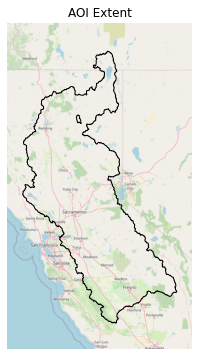

In [3]:
buffer = 0.5
contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa'))
ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator(), extent=aoi.geometry.envelope.buffer(buffer).total_bounds)
ax = gplt.polyplot(aoi.geometry, ax=ax, edgecolor='black', zorder=1000)
plt.title("AOI Extent")

GRACE Data Processing
=

Data Load
--

We already found that the longitude coords were in degrees east (0 to 360),
whereas we want true longitude (-180 to +180) for compatibility with our
AOI geometry. The cli tool `cdo` helped us a lot with that issue, translating
the coordinates for us with the following invocation:

```
cdo -sellonlatbox,-180,180,-90,90 <input_netCDF> <output_netCDF>
```

After this transformation, we can use `rioxarray` to easily load and work with
the netCDF files.

Let's open the main GRACE data file and see what we can do with it.

In [4]:
file_name = './data/grace/combined/GRCTellus.JPL.200204_202103.GLO.RL06M.MSCNv02CRI.nc.latlon'
xar = rioxarray.open_rasterio(file_name, decode_coords="all", parse_coordinates=True, decode_times=True, masked=True)
xds = xar[3].rio.write_crs(4326)

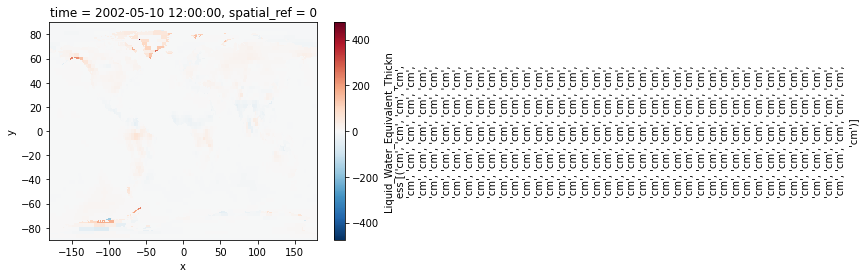

In [5]:
xds.lwe_thickness[1].plot()

We see we can access the LWE subdataset as an attribute of the xarray, and
a basic (if strangely-labeled) visualisation is just a function call away.

Data Visualization and Understanding
--

Now that we see how easy it is to get to the data, we should be able to clip
our global dataset to our AOI envelope.

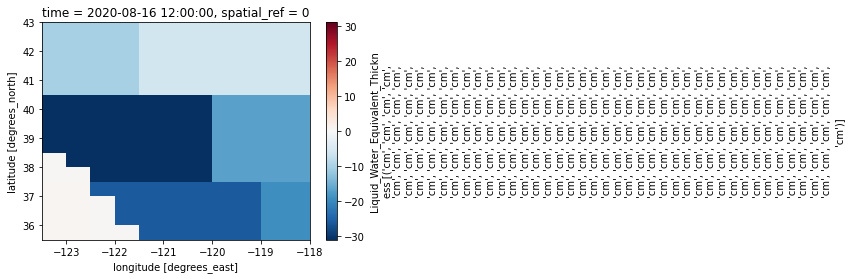

In [6]:
clipds = xds.lwe_thickness.rio.clip(aoi.geometry.envelope.buffer(buffer))

clipds[187].plot()

We can also generate a mask to ensure we are left with just the cells contained within our AOI (based on centroids, in this case).

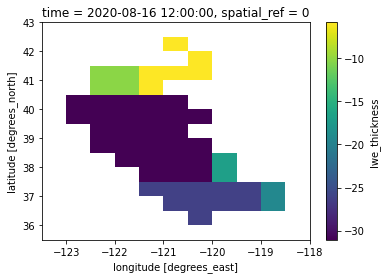

In [7]:
mask = features.rasterize(
    shapes=aoi.geometry,
    fill=np.nan,
    out_shape=clipds[0].shape,
    transform=clipds.rio.transform(),
)

(clipds[187] * mask).plot()

With all these dates, perhaps an animation could be an interesting way to explore
these data. After all, we see how easy it is to plot, so we can make a plot per
date and combine those to make a gif.

Before we get too far with the animation though, I think it would be best if we pick
one color map and set a fixed range on it for all the dates. Ideally we could discover
the min and max values for that range from our masked data. Let's see if we can't put
together a little function to find those values.

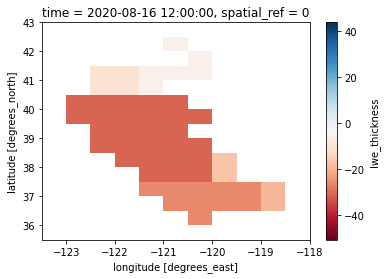

In [8]:
def grace_vrange(timeseries, mask=None):
    vmin=None
    vmax=None
    for t in timeseries:
        masked = t * mask if mask is not None else t
        vmax = max(masked.max(), vmax) if vmax is not None else masked.max()
        vmin = min(masked.min(), vmin) if vmin is not None else masked.min()
    return (vmin, vmax)

vmin, vmax = grace_vrange(clipds, mask=mask)
(clipds[187] * mask).plot(cmap='RdBu', vmin=vmin, vmax=vmax)

Seems like that worked well. But our plot still leaves a bit to be desired.
We should fix the title, add units to the color map legend, superimpose our
AOI boundary, and also add some text indicating the mean LWE value across
our AOI.

In [9]:
def grace_date_to_str(data_array):
    return data_array.time.to_dict()['data'].strftime('%Y-%m-%d')

grace_date_to_str(clipds[1])

'2002-05-10'

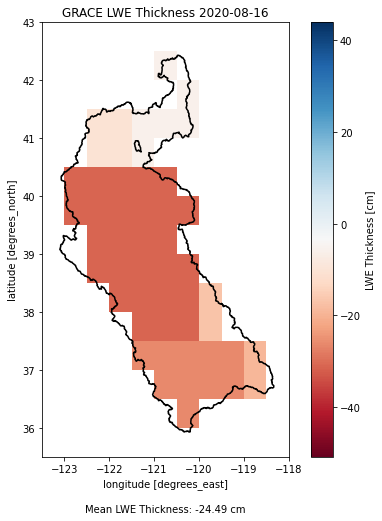

In [10]:
def grace_plot_ds(data_array, mask=None, vmin=None, vmax=None):
    ax = aoi.geometry.boundary.plot(edgecolor='black')
    data = data_array * mask if mask is not None else data_array
    ax = data.plot(cmap='RdBu', vmin=vmin, vmax=vmax, ax=ax)
    mean_cm = data.mean()
    plt.title('GRACE LWE Thickness {}'.format(grace_date_to_str(data_array)))
    plt.figtext(
        .53,
        .03,
        'Mean LWE Thickness: {:.2f} cm'.format(float(mean_cm)),
        ha='center',
    )
    ax.colorbar.set_label('LWE Thickness [cm]')
    ax.figure.set_facecolor('white')
    ax.figure.set_size_inches(8,8)
    return ax

grace_plot_ds(clipds[187], mask=mask, vmin=vmin, vmax=vmax)

With a few small tweaks, that plot looks a whole lot better. Now that we
have a function to create such a plot from a GRACE dataset, we can iterate
through all the GRACE datasets in our timeseries. We'll write each plot out
to a temp file, and then we will use `imageio` to put all the plot images
together into an animated gif.

In [11]:
def grace_animate(timeseries, filename, fps=10, mask=None, vmin=None, vmax=None):
    with tempfile.TemporaryDirectory() as _dir:
        _dir = Path(_dir)
        imgs = []
        for index, ds in enumerate(timeseries):
            ax = grace_plot_ds(ds, mask=mask, vmin=vmin, vmax=vmax)
            f = str(_dir.joinpath(str(index) + '.png'))
            ax.figure.savefig(f, bbox_inches="tight", pad_inches=0.1)
            plt.close(ax.figure)
            # seems like we should be able to get the bytes from
            # the plot and load them into an imageio object without
            # using the temp storage, but we'll do this for now...
            imgs.append(imageio.imread(f))
        imageio.mimsave(filename, imgs, fps=9)

In [12]:
grace_animate(clipds, './grace.gif', fps=9, mask=mask, vmin=vmin, vmax=vmax)

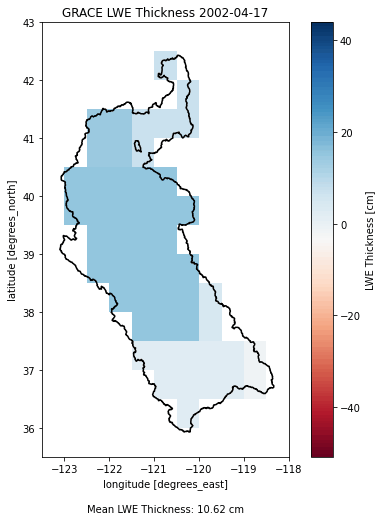

Scale factor
--

We can use the scale factor dataset to increase the resolution of the GRACE data via simple multiplcation.
Let's open the scale factor netCDF file and use it to scale up one of the GRACE dates. We'll clip it to
the AOI like we did with the GRACE data, so we can use it with the mask parameter to our existing functions.

In [13]:
file_name = './data/grace/combined/CLM4.SCALE_FACTOR.JPL.MSCNv02CRI.nc.latlon'
sf = rioxarray.open_rasterio(file_name, decode_coords="all", parse_coordinates=True, decode_times=True, masked=True)
sf = sf[0].rio.write_crs(4326)
sf_clip = sf.rio.clip(aoi.geometry.envelope.buffer(buffer))

Here is an "unscaled" date:

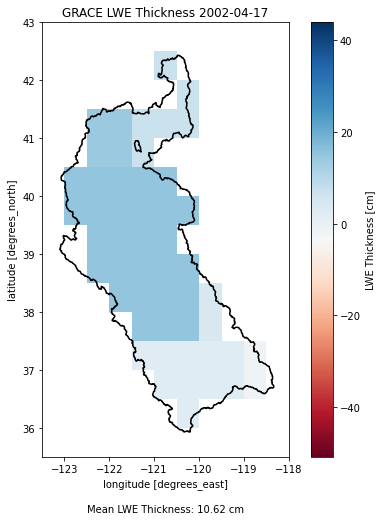

In [14]:
grace_plot_ds(clipds[0], mask=mask, vmin=vmin, vmax=vmax)

Here is a "scaled" date:

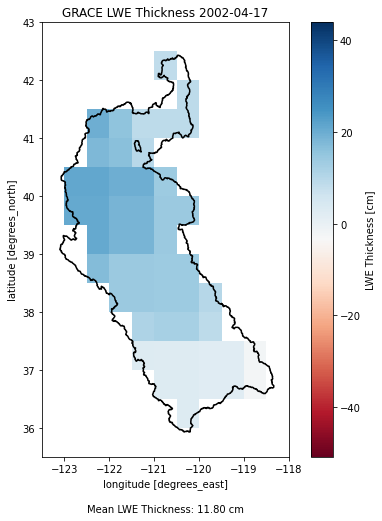

In [15]:
grace_plot_ds(clipds[0], mask=(sf_clip * mask), vmin=vmin, vmax=vmax)

Notice the additional spatial resolution? As well, the mean changed subtly, because
the correction factors helped increase the GRACE measurement accuracy.

This certainly seems like better data to base our groundwater anaylsis on, so perhaps
we can create a new animation using the scaled data. We'll need to recompute our `vmin`
and `vmax` values as well.

In [16]:
scaled_vmin, scaled_vmax = grace_vrange(clipds, mask=(sf_clip * mask))
grace_animate(
    clipds,
    './grace-scaled.gif',
    fps=9,
    mask=(sf_clip * mask),
    vmin=scaled_vmin,
    vmax=scaled_vmax,
)

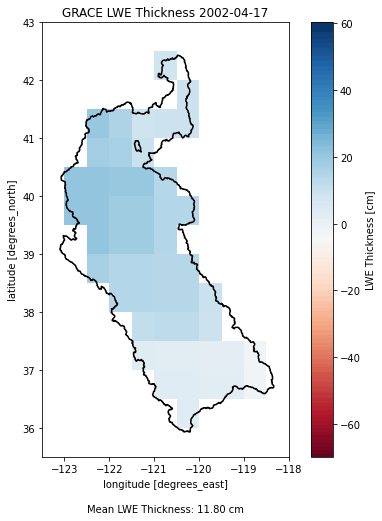

Plotting the Data
=

Now that we have a good visualization of the data spatially over time,
let's plot the mean LWE values over time to see what that trend looks like.
We'll subtract the time-mean mass field over the length of the observations
to better highlight the mass anomalies over the data timeseries.

In [17]:
from datetime import date

average_grid = (clipds * mask * sf_clip).mean(dim='time')

dates = []
means = []
corrected = []
for ds in clipds:
    dates.append(date.fromisoformat(grace_date_to_str(ds)))
    means.append(float((ds * mask * sf_clip).mean().values))
    corrected.append(float(((ds * mask * sf_clip) - average_grid).mean().values))

In [18]:
df = pd.DataFrame(
    zip(dates, means, corrected),
    columns=('date', 'mean_lwe', 'corrected_mean_lwe'),
    index=dates,
)

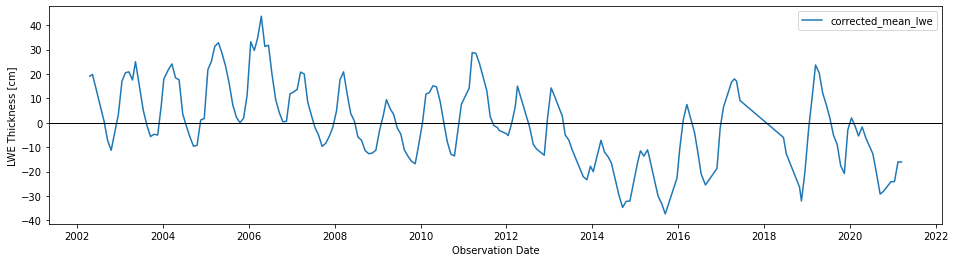

In [19]:
ax = df.plot(x='date', y='corrected_mean_lwe', figsize=(16, 4))
ax.set_xlabel('Observation Date')
ax.set_ylabel('LWE Thickness [cm]')
ax.axhline(y=0, color='black', lw=1)

Trend over time
--

It is fairly obvious that the LWE Thickness trends downward over time,
but exactly how much is not completely clear from the plot, given the
seasonal oscillations. To better quantify that loss, let's plot a trend
line and use that trend to calculate the total loss over the period.

In [20]:
def trend_line(x, y):
    n = len(x)
    sum_xy = 0
    sum_x = 0
    sum_x2 = 0
    sum_y = 0
    for x, y in zip(x, y):
        sum_xy += x * y
        sum_x += x
        sum_x2 += x ** 2
        sum_y += y
        
    m = (sum_xy - (sum_x * sum_y) / n) / (sum_x2 - (sum_x ** 2) / n)
    b = (sum_y / n) - m * (sum_x / n)
    
    return m, b
        
slope, intercept = trend_line(range(len(corrected)), corrected)

min_val = None
max_val = None
min_x = None
max_x = None

def _min(val, x, min_val, min_x):
    if min_val is not None and min_val <= val:
        return min_val, min_x
    return val, x

def _max(val, x, max_val, max_x):
    if max_val is not None and max_val >= val:
        return max_val, max_x
    return val, x

for i_obs in range(len(corrected)):
    min_val, min_x = _min(intercept + slope * i_obs, i_obs, min_val, min_x)
    max_val, max_x = _max(intercept + slope * i_obs, i_obs, max_val, max_x)

print('slope: {}, intercept: {}'.format(slope, intercept))
print('min: {}, {}; max: {}, {}'.format(min_x, min_val, max_x, max_val))

slope: -0.14545085795072502, intercept: 14.108733221220326
min: 194, -14.108733221220326; max: 0, 14.108733221220326


Text(0.51, -0.04, 'Total LWE thickness loss over time: 28.22 cm')

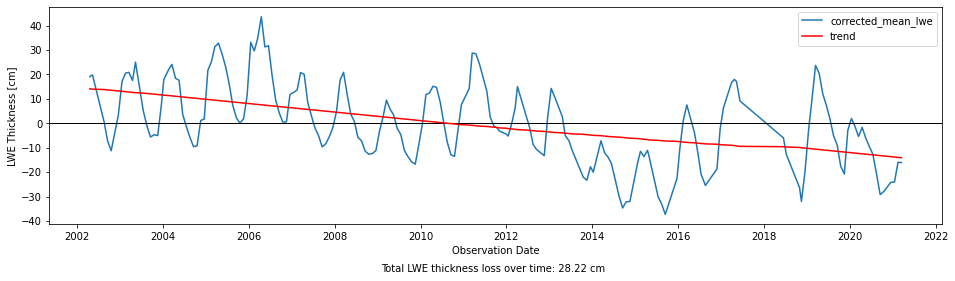

In [21]:
ax = df.plot(x='date', y='corrected_mean_lwe', figsize=(16, 4))
ax.set_xlabel('Observation Date')
ax.set_ylabel('LWE Thickness [cm]')
ax.axhline(y=0, color='black', lw=1)
ax.figure.set_facecolor('white')

def trend_y(m, b, count):
    for x in range(count):
        yield m * x + b

plt.plot(dates, list(trend_y(slope, intercept, len(corrected))), 'r', label='trend')
plt.legend()
plt.figtext(
    0.51,
    -0.04,
    'Total LWE thickness loss over time: {:.2f} cm'.format(max_val - min_val),
    ha='center',
)

This isn't all Groundwater...
==

The above certainly contains a groundwater signal, the strength of which is
likely increased given the 19-year duration of the dataset and the more-transient
nature of other major sources of gravitaional anomalies. However, we can be sure
that snowpack, soil moisture, and surface water storage all contribute to the
above signal and obscure that of the groundwater.

We can tease out a stronger groundwater signal by subtracting one or more of the
above from the GRACE measurements. Let's start by trying that out with soil moisture.

We can get soil moisture from the Global Land Data Assimilation System (GLDAS).
Unlike the GRACE L3 Handbook analysis on which we are basining this project,
we will use the GLDAS Noah Land Surface Model L4 monthly 0.25 degree V2.1
(GLDAS_NOAH10_M) product. The reasoning for this change is that 
this dataset covers the globe, rather than just North America, which
does not limit our analysis to a specific geographical region.

We did not find those data in a single netCDF stack, but as individual gridded binary files,
so we will have to build all those files into a stack ourselves. We can do that with `cdo`
via the following operation:

```
    cdo mergetime "$GLDAS_DIR/*.nc4" "$MERGED"
```

With that stack, we can continue by exploring what those data look like.


...Except for now we are going to call this the end of the road, and save these improvements
for a later date.